<a href="https://colab.research.google.com/github/PedroHON410/Dogs-vs-Cats-DL-training/blob/main/Dogs_vs_Catas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
##Import modulos
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import warnings
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')
import os
import tqdm
import random
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from sklearn.model_selection import train_test_split

In [2]:
## Download Dataset
!wget https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip

--2025-10-07 16:11:42--  https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.44.74.17, 2600:1405:8400:58a::317f, 2600:1405:8400:58b::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.44.74.17|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  92.5MB/s    in 7.6s    

2025-10-07 16:11:49 (104 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



In [3]:
## Unzip the Dataset
!unzip -q kagglecatsanddogs_5340.zip

In [4]:

## Create Dataframe for input and output
input_path = []
label = []

for class_name in os.listdir("PetImages"):
  for path in os.listdir(os.path.join('PetImages', class_name)):
    if class_name == 'Cat':
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join('PetImages', class_name, path))
print(input_path[0], label[0])

PetImages/Dog/5551.jpg 1


In [5]:
df = pd.DataFrame({'images': input_path, 'label': label})
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/1402.jpg,0
1,PetImages/Cat/9632.jpg,0
2,PetImages/Cat/100.jpg,0
3,PetImages/Dog/12196.jpg,1
4,PetImages/Cat/9916.jpg,0


In [6]:
##Delete db files
for i in df['images']:
  if 'jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [7]:
import PIL
l = []
for image in df['images']:
  try:
    img = PIL.Image.open(image)
  except:
    l.append(image)

In [8]:
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

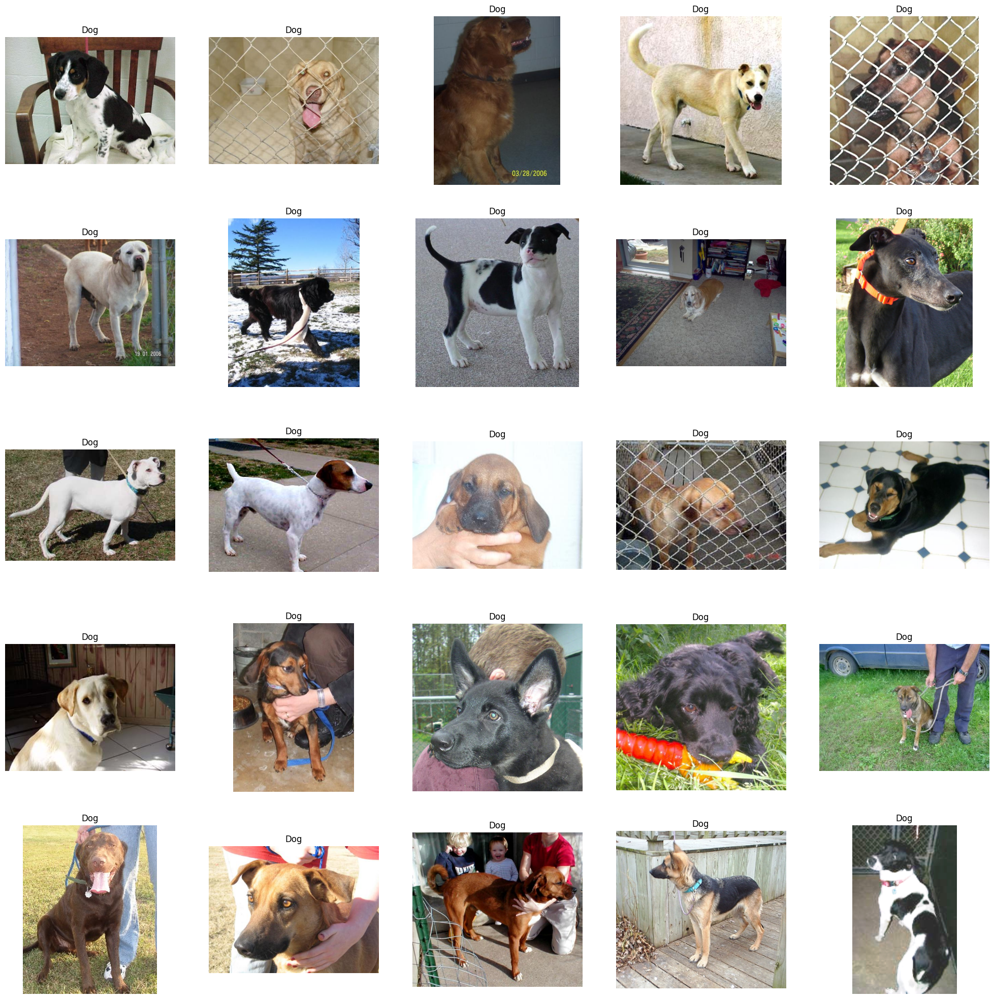

In [9]:
## Exploratory Data Analysis
#To display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]["images"]
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title("Dog")
  plt.axis('off')

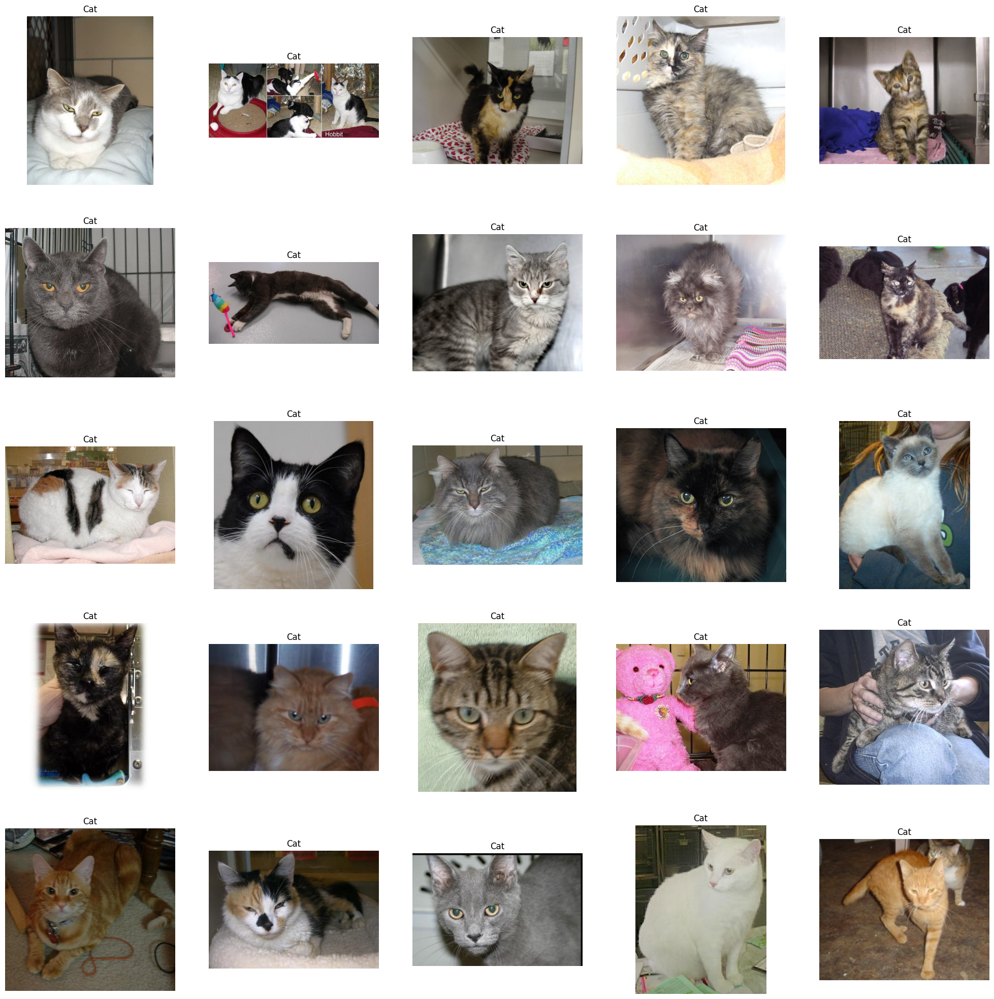

In [10]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]["images"]
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title("Cat")
  plt.axis('off')

<Axes: ylabel='count'>

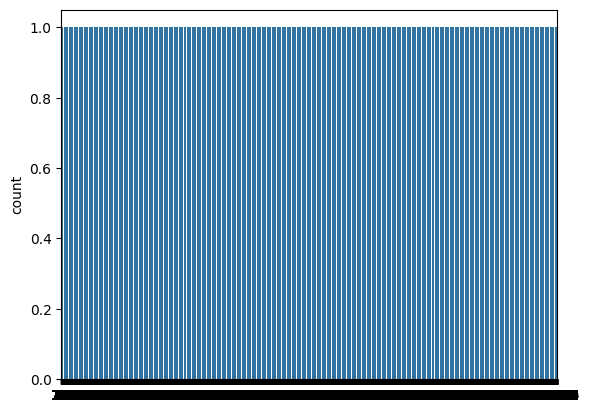

In [11]:
sns.countplot(df['label'])

In [12]:
df['label'] = df['label'].astype('str')

In [13]:
df.head()

,images,label
0,PetImages/Cat/1402.jpg,0
1,PetImages/Cat/9632.jpg,0
2,PetImages/Cat/100.jpg,0
3,PetImages/Dog/12196.jpg,1
4,PetImages/Cat/9916.jpg,0


In [14]:
#input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [15]:
test.head()

,images,label
6871,PetImages/Dog/4946.jpg,1
22913,PetImages/Dog/446.jpg,1
9671,PetImages/Dog/6174.jpg,1
13641,PetImages/Cat/987.jpg,0
23341,PetImages/Cat/8459.jpg,0


In [16]:
train_generator = ImageDataGenerator(
    rescale= 1./255,
  rotation_range=40,
  shear_range=0.2,
  zoom_range=0.2,
  horizontal_flip=True,
)

val_generator = ImageDataGenerator(rescale=1./255)

train_interator = train_generator.flow_from_dataframe(
    train,
    x_col = 'images',
    y_col = 'label',
    target_size = (128, 128),
    class_mode = 'binary',
    batch_size = 512
)

val_interator = val_generator.flow_from_dataframe(
    train,
    x_col = 'images',
    y_col = 'label',
    target_size = (128, 128),
    class_mode = 'binary',
    batch_size = 512
)

Found 19998 validated image filenames belonging to 2 classes.
Found 19998 validated image filenames belonging to 2 classes.


In [17]:
##Model Creation
model = Sequential([
  Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
  MaxPooling2D((2,2)),
  Conv2D(32, (3,3), activation='relu'),
  MaxPooling2D((2,2)),
  Conv2D(64, (3,3), activation='relu'),
  MaxPooling2D((2,2)),
  Flatten(),
  Dense(512, activation='relu'),
  Dense(1, activation='sigmoid')
])


In [18]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
history = model.fit(train_interator, epochs=10, validation_data=val_interator)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 532s 13s/step - accuracy: 0.5190 - loss: 0.7258 - val_accuracy: 0.6467 - val_loss: 0.6275
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 536s 13s/step - accuracy: 0.6581 - loss: 0.6201 - val_accuracy: 0.7011 - val_loss: 0.5705
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 536s 13s/step - accuracy: 0.7126 - loss: 0.5640 - val_accuracy: 0.7399 - val_loss: 0.5211
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 535s 13s/step - accuracy: 0.7387 - loss: 0.5250 - val_accuracy: 0.7357 - val_loss: 0.5237
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 548s 14s/step - accuracy: 0.7465 - loss: 0.5097 - val_accuracy: 0.7744 - val_loss: 0.4711
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 522s 13s/step - accuracy: 0.7490 - loss: 0.5057 - val_accuracy: 0.7759 - val_loss: 0.4645
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 545s 14s/step - accuracy: 0.7748 - loss: 0.4692 - val_accuracy: 0.8004 - val_loss: 0.4319
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 545s 14s/step - accuracy: 0.7861 - loss: 0.4537 - val_accuracy: 0.

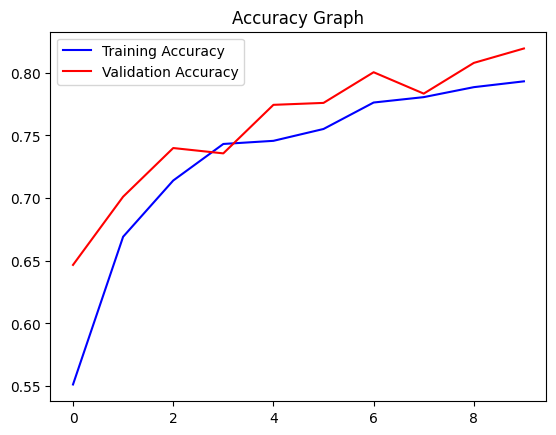

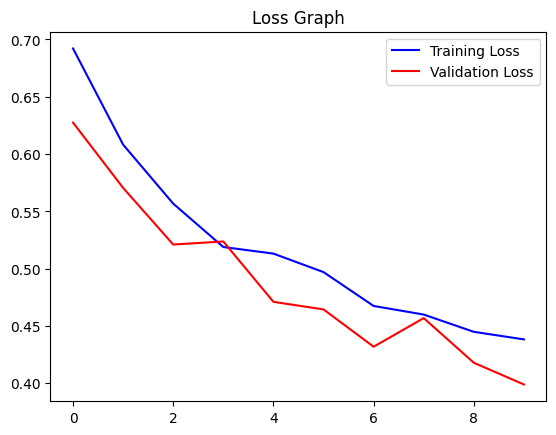

In [20]:
##visualization of Results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()
